# Notebook to preprocess the data for training

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
from glob import glob
import pickle
from tqdm.notebook import tqdm

In [2]:
size = 224  # size to crop out

depth = 24  # use 6 layers instead of the 65

start_depth = 65 // 2 - depth // 2  # take the middle layers instead of the top

folder = '/home/olli/Projects/Kaggle/Vesuvius'

save_folder = f'Preprocessed_{size}_{start_depth}_{depth}'  # new folder to store the cropped scans for training

path_save = os.path.join(folder, 'Data', save_folder)

if not os.path.exists(path_save):
    os.makedirs(path_save)

In [3]:
start_depth

20

In [4]:
path_train = os.path.join(folder, 'Data', 'train')

scans = [str(i) for i in range(1, 4)]

path_scans = [os.path.join(path_train, scans[i]) for i in range(3)]

path_scans

['/home/olli/Projects/Kaggle/Vesuvius/Data/train/1',
 '/home/olli/Projects/Kaggle/Vesuvius/Data/train/2',
 '/home/olli/Projects/Kaggle/Vesuvius/Data/train/3']

### Problem: There are a lot of regions outside the scan, these should not be saved

In [5]:
''' This function takes the path from the scan as input, crop the regions out from the scan that mainly consist of
    the scan, show the scan with the cropped regions and saves them with a certain depth'''

def crop_scan(path, name=False):
    
    # define the paths to the mask, the label, and the scans
    path_mask = os.path.join(path, 'mask.png')
    path_label = os.path.join(path, 'inklabels.png')
    scan_paths = glob(path + '/surface_volume/*.tif')
    scan_paths.sort()
    scan_paths = scan_paths[start_depth:start_depth+depth]  # only the depth layers defined
    mask = cv2.imread(path_mask, cv2.IMREAD_GRAYSCALE)
    label = cv2.imread(path_label, cv2.IMREAD_GRAYSCALE)
    
    # get the height and width to assign each layer in a fitting array
    height, width = mask.shape
    
    scan = np.empty((height, width, depth), dtype=np.uint8)
    
    for layer, scan_path in enumerate(scan_paths):
        current_layer = cv2.imread(scan_path, cv2.IMREAD_GRAYSCALE)
        scan[:, :, layer] = current_layer
   
    # first add zeros around the mask/label/scan to make it perfectly dividable by size
    rest_height = height % size
    rest_width = width % size
    
    # values to add
    add_height = size - rest_height
    add_width = size - rest_width
    
    # new shapes
    new_height = height + add_height
    new_width = width + add_width
    
    # create a new mask/label/scan with the new shape and only zeros
    new_mask = np.zeros((new_height, new_width), dtype=np.uint8)
    new_label = np.zeros((new_height, new_width), dtype=np.uint8)
    new_scan = np.zeros(((new_height, new_width, depth)), dtype=np.uint8)
    
    # now add the mask/label/scan in the correct place (i.e. in the middle after padding)
    start_height = add_height // 2
    start_width = add_width // 2
    
    # assign them
    new_mask[start_height: start_height + height, start_width: start_width + width] = mask
    new_label[start_height: start_height + height, start_width: start_width +  width] = label
    new_scan[start_height: start_height + height, start_width: start_width + width, :] = scan

    # short on ram
    del mask
    del label
    del scan

    # save it to the folder name (each scan later is one fold)
    if name:
        path_save_scan = os.path.join(path_save, str(name))
        
        if not os.path.exists(path_save_scan):
            os.makedirs(path_save_scan)
        
        index = 0  # index for a unique filename
        
        # loop over all the possible heights and widths, crop them out and then save them to the new folder
        for h in tqdm(range(0, new_height, size//2)):
            
            for w in range(0, new_width, size//2):
                
                label_crop = new_label[h: h + size, w: w + size]
                mask_crop = new_mask[h: h + size, w: w + size]
                
                # if there is no (scan) ink in the image, dont save it and start with next
                if label_crop.max() <= 0:
                    
                    del label_crop
                    del mask_crop
                    
                    continue
                
                # save it
                else:     
                    scan_crop = new_scan[h: h + size, w: w + size, :]
                    
                    tuple_save = (scan_crop, label_crop)

                    path_save_tuple = os.path.join(path_save_scan, str(index) + '.pickle')

                    with open(path_save_tuple, 'wb') as f:
                        pickle.dump(tuple_save, f)

                    del label_crop
                    del mask_crop
                    del scan_crop
                    del tuple_save
                    
                    index += 1  # increase naming index when crop gets saved

In [6]:
crop_scan(path_scans[0], name=1)

  0%|          | 0/74 [00:00<?, ?it/s]

In [7]:
crop_scan(path_scans[1], name=2)

  0%|          | 0/134 [00:00<?, ?it/s]

In [8]:
crop_scan(path_scans[2], name=3)

  0%|          | 0/68 [00:00<?, ?it/s]

# Show some results

In [9]:
exp_files = glob(path_save + '/1/*pickle')

In [10]:
len(exp_files)

1333

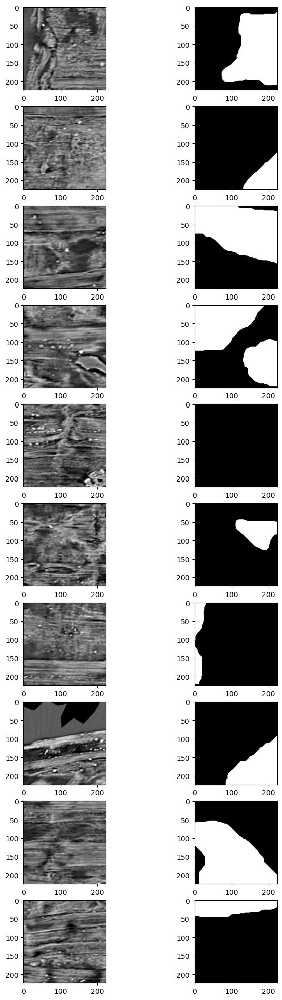

In [11]:
fig, ax = plt.subplots(nrows=10, ncols=2, figsize=(8, 25))
for i in range(10):
    path_file = exp_files[i]
    with open(path_file, 'rb') as f:
        file = pickle.load(f)
    scan, label = file
    ax[i, 0].imshow(scan[:,:,0], cmap='gray')
    ax[i, 1].imshow(label, cmap='gray')

# Finally check the percentage of ink in all saved cropped regions

In [13]:
for i in range(3):

    ink_ratio = []
    
    path = os.path.join(folder, 'Data', save_folder, str(i + 1))
    
    files = glob(path + '/*.pickle')
    
    for file in files:
        
        with open(file, 'rb') as f:
            data = pickle.load(f)
        
        X, y = data

        y = y / 255.
        ink_ratio.append(y.sum() / len(y.reshape(-1)))
                
    ratio = sum(ink_ratio) / (len(ink_ratio) - sum(ink_ratio))
 
    print(f'SCAN {i + 1}:\nRation from Ink to No-Ink: {ratio:.3f}\n')

SCAN 1:
Ration from Ink to No-Ink: 0.469

SCAN 2:
Ration from Ink to No-Ink: 0.420

SCAN 3:
Ration from Ink to No-Ink: 0.354



In [30]:
exps = glob(path_save + '/3/*.pickle')

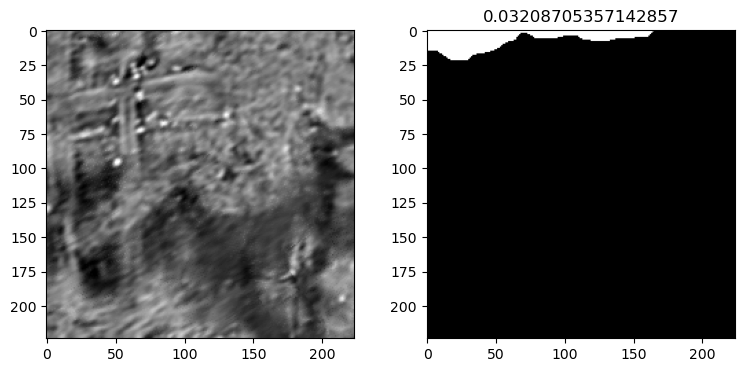

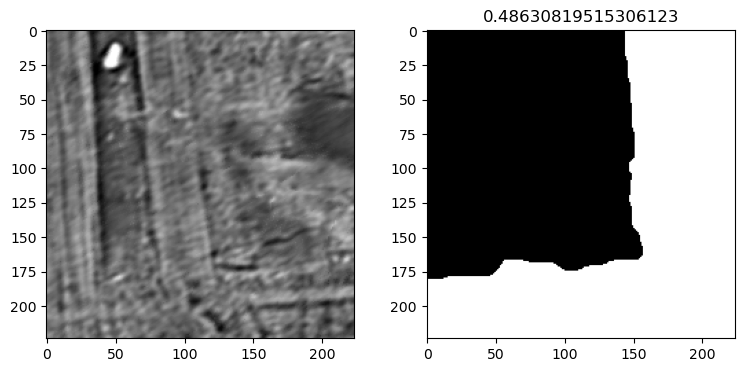

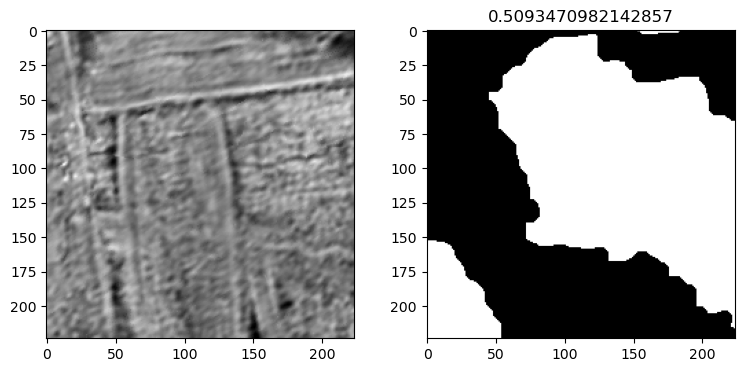

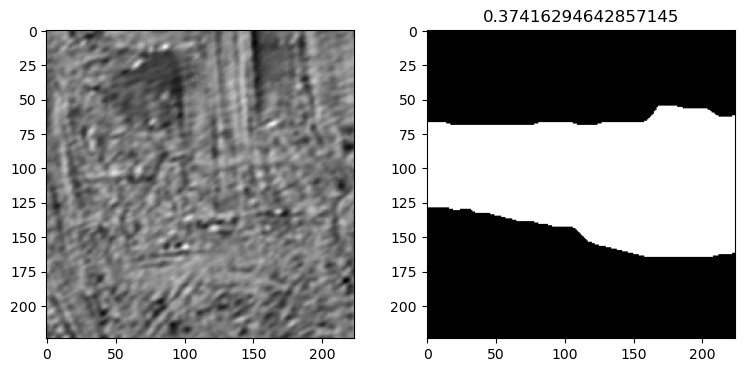

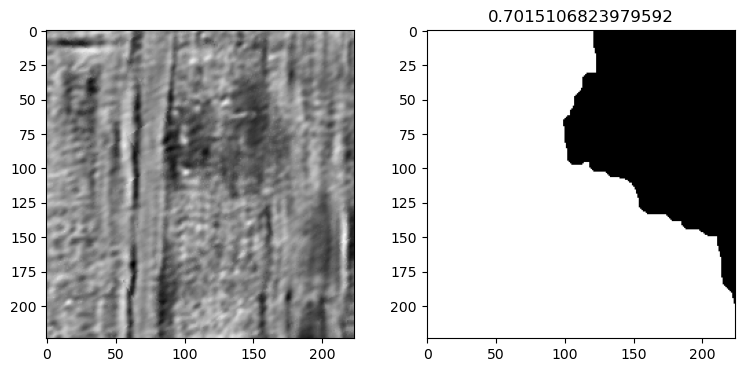

...

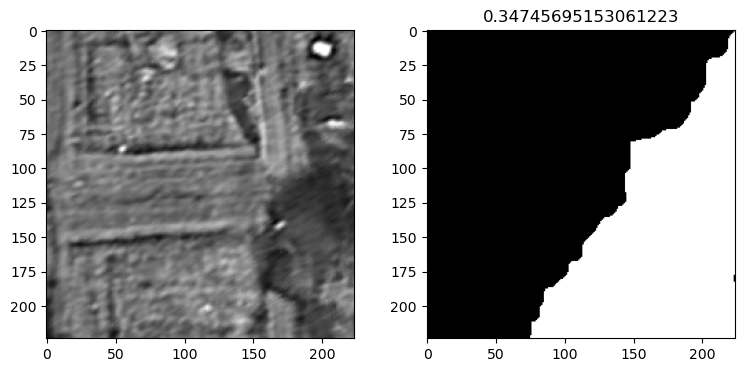

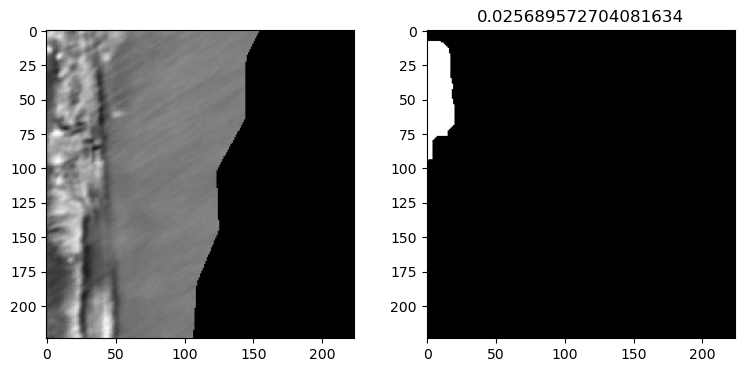

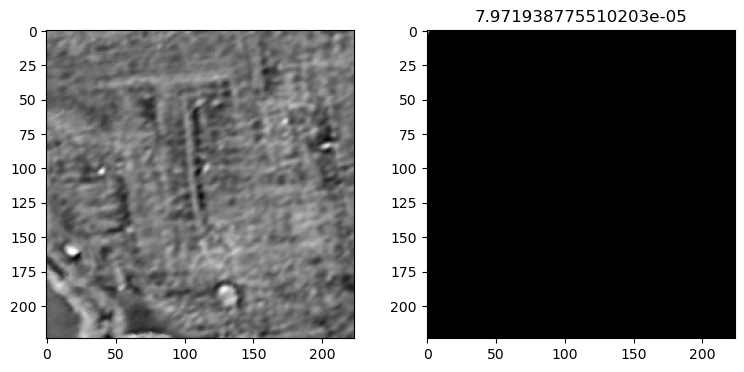

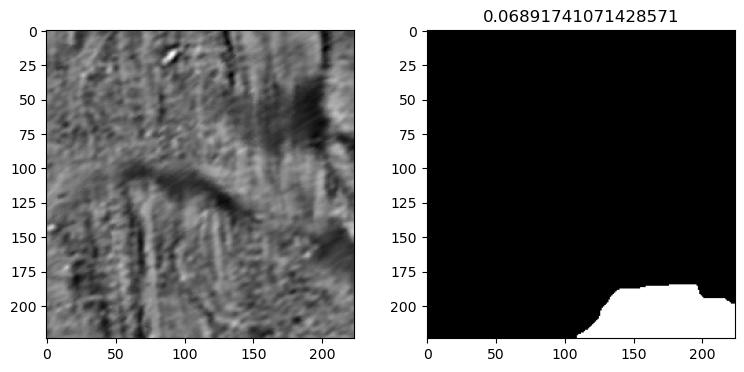

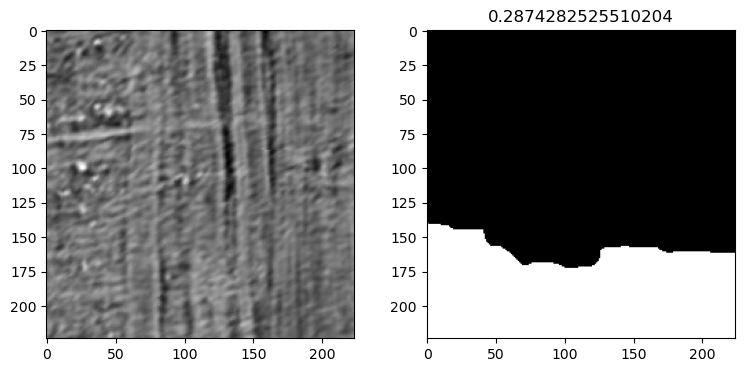

In [31]:
for exp in exps[:100]:
    with open(exp, 'rb') as f:
        data = pickle.load(f)
        
    X, y = data
    
    y_ = y / 255.
    
    ink_p = y_.sum() / len(y_.reshape(-1))
    
    fig, ax = plt.subplots(1, 2, figsize=(9, 4))
    ax[0].imshow(X[:,:,0], cmap='gray')
    ax[1].imshow(y, cmap='gray')
    ax[1].set_title(ink_p)
    plt.show()